<a href="https://colab.research.google.com/github/dianneebora/LE1_Ebora_D/blob/main/LE1_Ebora__D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import warnings
warnings.filterwarnings('ignore')

#importing the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
!pip install ucimlrepo

In [4]:
from ucimlrepo import fetch_ucirepo
import pandas as pd

# Fetch dataset
electrical_grid_stability_simulated_data = fetch_ucirepo(id=471)

# Define features and target variable
features = ['tau1', 'tau2', 'tau3', 'tau4', 'p1', 'p2', 'p3', 'p4', 'g1', 'g2', 'g3', 'g4']
target_variable = 'stab'

# Extract features (X) and target variable (y) from the dataset
X = electrical_grid_stability_simulated_data.data.features[features]
y = electrical_grid_stability_simulated_data.data.targets[target_variable]

# Metadata
print(electrical_grid_stability_simulated_data.metadata)

# Variable information
print(electrical_grid_stability_simulated_data.variables)

{'uci_id': 471, 'name': 'Electrical Grid Stability Simulated Data ', 'repository_url': 'https://archive.ics.uci.edu/dataset/471/electrical+grid+stability+simulated+data', 'data_url': 'https://archive.ics.uci.edu/static/public/471/data.csv', 'abstract': 'The local stability analysis of the 4-node star system (electricity producer is in the center) implementing Decentral Smart Grid Control concept. ', 'area': 'Physics and Chemistry', 'tasks': ['Classification', 'Regression'], 'characteristics': ['Multivariate'], 'num_instances': 10000, 'num_features': 12, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['stab', 'stabf'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 2018, 'last_updated': 'Tue Jan 09 2024', 'dataset_doi': '10.24432/C5PG66', 'creators': ['Vadim Arzamasov'], 'intro_paper': None, 'additional_info': {'summary': "The analysis is performed for different sets of input values using the methodology similar to

In [5]:
dataset = pd.read_csv('/content/drive/MyDrive/dataset/electricalgridstabilitysimulateddata.csv')
dataset.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,unstable
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,stable
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,unstable
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,unstable
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,unstable


In [6]:
dataset.shape

(10000, 14)

In [7]:
dataset.describe()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5.250000,5.250001,5.250004,5.249997,3.750000,-1.250000,-1.250000,-1.250000,0.525000,0.525000,0.525000,0.525000,0.015731
std,2.742548,2.742549,2.742549,2.742556,0.752160,0.433035,0.433035,0.433035,0.274256,0.274255,0.274255,0.274255,0.036919
min,0.500793,0.500141,0.500788,0.500473,1.582590,-1.999891,-1.999945,-1.999926,0.050009,0.050053,0.050054,0.050028,-0.080760
25%,2.874892,2.875140,2.875522,2.874950,3.218300,-1.624901,-1.625025,-1.624960,0.287521,0.287552,0.287514,0.287494,-0.015557
50%,5.250004,5.249981,5.249979,5.249734,3.751025,-1.249966,-1.249974,-1.250007,0.525009,0.525003,0.525015,0.525002,0.017142
75%,7.624690,7.624893,7.624948,7.624838,4.282420,-0.874977,-0.875043,-0.875065,0.762435,0.762490,0.762440,0.762433,0.044878
max,9.999469,9.999837,9.999450,9.999443,5.864418,-0.500108,-0.500072,-0.500025,0.999937,0.999944,0.999982,0.999930,0.109403


In [8]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   tau1    10000 non-null  float64
 1   tau2    10000 non-null  float64
 2   tau3    10000 non-null  float64
 3   tau4    10000 non-null  float64
 4   p1      10000 non-null  float64
 5   p2      10000 non-null  float64
 6   p3      10000 non-null  float64
 7   p4      10000 non-null  float64
 8   g1      10000 non-null  float64
 9   g2      10000 non-null  float64
 10  g3      10000 non-null  float64
 11  g4      10000 non-null  float64
 12  stab    10000 non-null  float64
 13  stabf   10000 non-null  object 
dtypes: float64(13), object(1)
memory usage: 1.1+ MB


In [9]:
dataset.columns

Index(['tau1', 'tau2', 'tau3', 'tau4', 'p1', 'p2', 'p3', 'p4', 'g1', 'g2',
       'g3', 'g4', 'stab', 'stabf'],
      dtype='object')

In [10]:
dataset.duplicated().sum()

0

In [11]:
dataset.isna().sum()

tau1     0
tau2     0
tau3     0
tau4     0
p1       0
p2       0
p3       0
p4       0
g1       0
g2       0
g3       0
g4       0
stab     0
stabf    0
dtype: int64

In [12]:
# Checking Null values
dataset.isnull().sum()*100/dataset.shape[0]
# There are no NULL values in the dataset, hence it is clean.

tau1     0.0
tau2     0.0
tau3     0.0
tau4     0.0
p1       0.0
p2       0.0
p3       0.0
p4       0.0
g1       0.0
g2       0.0
g3       0.0
g4       0.0
stab     0.0
stabf    0.0
dtype: float64

In [13]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

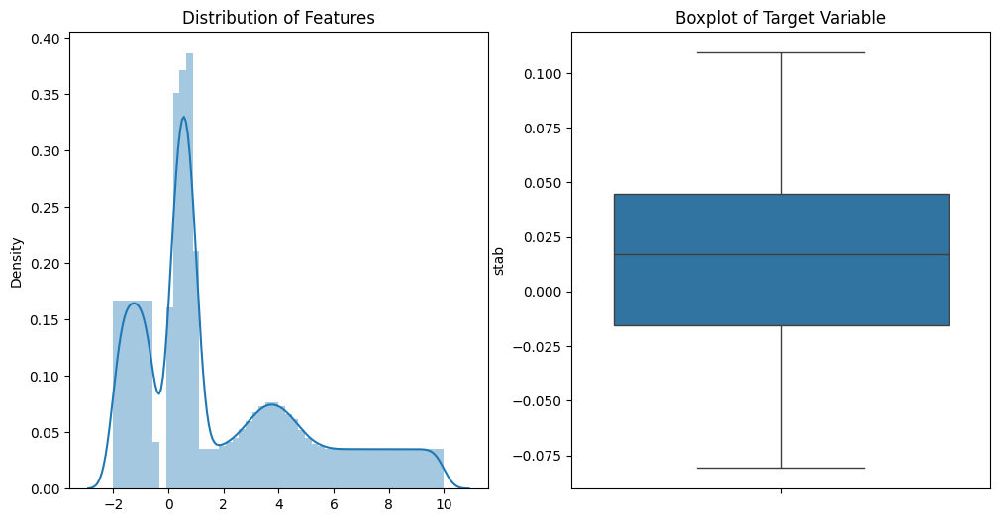

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title('Distribution of Features')
sns.distplot(X)

plt.subplot(1, 2, 2)
plt.title('Boxplot of Target Variable')
sns.boxplot(y)

plt.show()

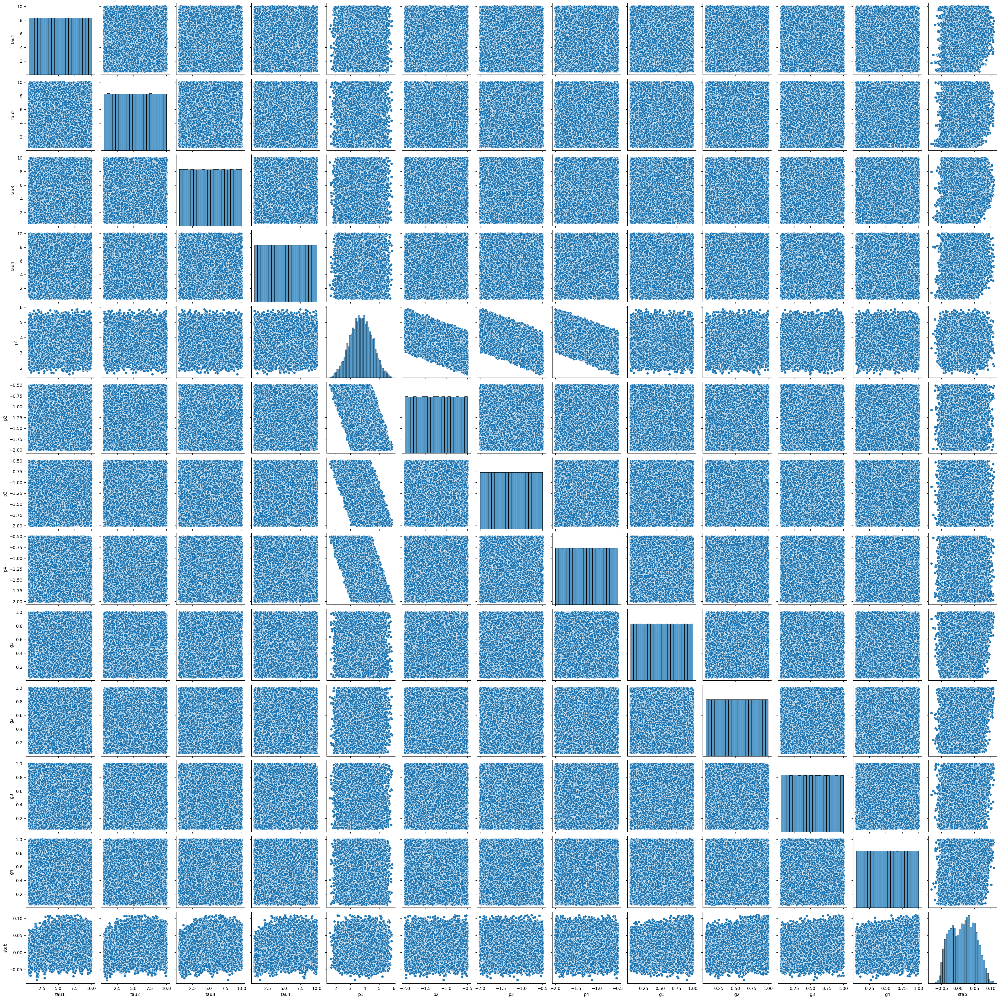

In [15]:
import seaborn as sns

plot_size = 4
sns.pairplot(dataset)

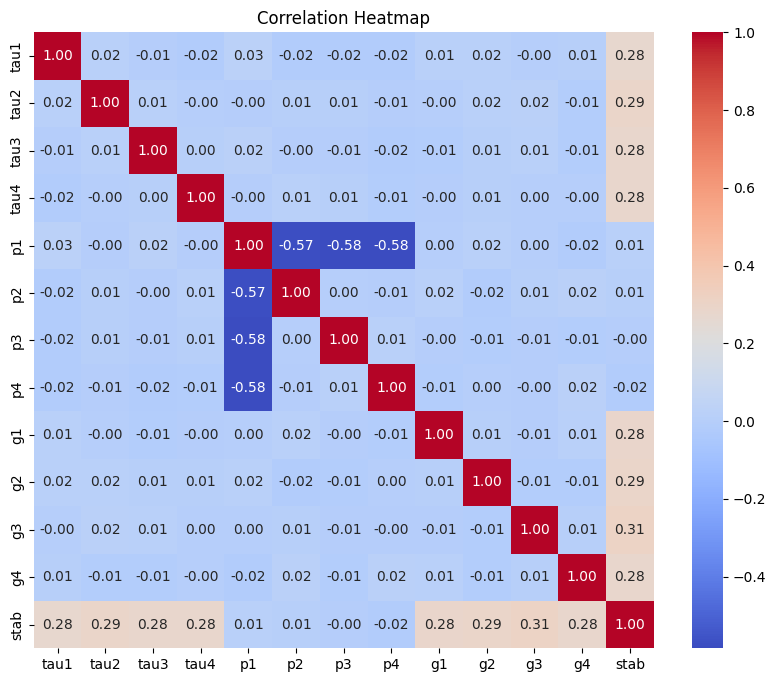

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

numeric_columns = dataset.select_dtypes(include=['float64', 'int64'])
correlation_matrix = numeric_columns.corr()
plt.figure(figsize=(10, 8))

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

plt.title('Correlation Heatmap')
plt.show()

In [17]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [18]:
lm = LinearRegression()
lm.fit(X_train,y_train)

LinearRegression()

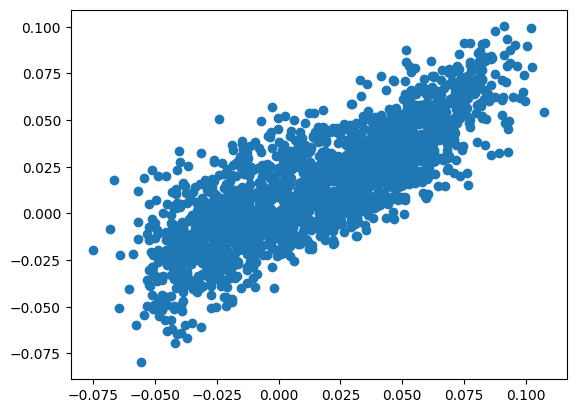

In [20]:
pred = lm.predict(X_test)
plt.scatter(y_test, pred)

In [21]:
from sklearn import metrics

print('MSE:', metrics.mean_squared_error(y_test, pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred)))
print('r2:', metrics.r2_score(y_test, pred))

MSE: 0.00048313140183376687
RMSE: 0.021980250267769175
r2: 0.6438052295917744
